In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from owi_data_2_pandas.io import API
import datetime
from pytz import utc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Import vub Meetenet Vlaamse Banken API functions
from vubmvbc.config import Credentials
from vubmvbc.client import Base
from vubmvbc.objects import Catalog, Data
import vubmvbc.data_getter as dg

from oma_tracking.oma_clustering import ModeClusterer, ModeClusterer_HDBSCAN
from oma_tracking.data.make_dataset import get_mpe_data
from oma_tracking.data.utils import read_simulations_csv_files
from oma_tracking.data import make_dataset


In [3]:
import sklearn
sklearn.__version__

'1.3.0'

In [4]:
start =  datetime.datetime(2022,11,1,tzinfo=utc)
stop  = datetime.datetime(2023,5,4,tzinfo=utc)
end_date = datetime.datetime(2023,5,4,tzinfo=utc)
location = 'nw2d01'
name_location = 'NW2_D01'
home_folder = "../../../"
data_path = home_folder + "data/nw2/raw/" + location + "_" + start.strftime("%Y%m%d") + "_" + stop.strftime("%Y%m%d") + ".parquet"
weather_data_path = home_folder + "data/nw2/mvbc_data.parquet"
tracked_frequencies_path = home_folder + "data/nw2/tracked_modes/harmonics_removed/" + location + ".parquet"
simulations_data_path = home_folder + "data/nw2/simulations/" + location + "/"

turbine_data = pd.read_parquet(data_path).loc[:end_date]
turbine_data = turbine_data.loc[~turbine_data.index.duplicated(keep='first')]
weather_station_data_LAT = pd.read_parquet(weather_data_path).loc[:end_date]


# Get all the data
data = pd.read_parquet(data_path).loc[:end_date]
mvbc_data = pd.read_parquet(weather_data_path).loc[:end_date]
tracked_frequencies = pd.read_parquet(tracked_frequencies_path).loc[:end_date]
simulation_data = read_simulations_csv_files(simulations_data_path + "eigen_frequencies/")
simulation_shifts = read_simulations_csv_files(simulations_data_path + "mean_shifts/")
simulation_errors = pd.read_csv(simulations_data_path + "errors/Errors_No_scour.csv", index_col=0)


name_location = 'NW2_D01'
mpe_data = {}
directions = ['SS', 'FA']
for direction in directions:
    mpe_data[direction] = get_mpe_data(turbine_data, direction, name_location)

In [5]:
scada_inputs = make_dataset.get_scada_subset(data)
weather_data = mvbc_data[mvbc_data.columns[mvbc_data.isna().sum() < len(mvbc_data) * 0.1]]

In [6]:
inputs = \
    pd.concat(
        [
            weather_data,
            scada_inputs
        ],
        axis=1
    )

In [7]:
mpe_data

{'SS':                           algorithm  mean_damping  mean_frequency  size  \
 timestamp                                                                 
 2022-11-01 00:00:00+00:00      lscf      4.806132        0.220005    30   
 2022-11-01 00:00:00+00:00      lscf      3.664014        0.534838    25   
 2022-11-01 00:00:00+00:00      lscf      0.521448        1.051824    39   
 2022-11-01 00:00:00+00:00      lscf      2.455740        1.086731    31   
 2022-11-01 00:00:00+00:00      lscf      2.565565        1.560832    35   
 ...                             ...           ...             ...   ...   
 2023-05-04 00:00:00+00:00      lscf      1.348961        2.696763    41   
 2023-05-04 00:00:00+00:00      lscf      0.899155        3.497143    37   
 2023-05-04 00:00:00+00:00      lscf      0.325743        3.766517    21   
 2023-05-04 00:00:00+00:00      lscf      1.012516        4.172540    37   
 2023-05-04 00:00:00+00:00      lscf      0.586188        4.755943    27   
 
    

In [8]:
inputs.columns

Index(['mvbc_WandelaarBuoy_10%_highest_waves',
       'mvbc_WandelaarBuoy_Wave_height',
       'mvbc_WandelaarBuoy_Average_wave_period',
       'mvbc_WandelaarBuoy_Height_waves_with_period_>_10_s',
       'mvbc_WandelaarMeasuringpile_Max_3-seconds_wind_gust_(at_10_m_height)',
       'mvbc_WandelaarMeasuringpile_Average_wind_direction',
       'mvbc_WandelaarMeasuringpile_Average_wind_speed_(at_10_m_height)',
       'mvbc_WandelaarMeasuringpile_Tide_TAW',
       'mvbc_WandelaarMeasuringpile_Air_pressure',
       'mvbc_WandelaarMeasuringpile_Air_temperature', 'mean_NW2_D01_rpm',
       'mean_NW2_D01_yaw', 'mean_NW2_D01_pitch', 'mean_NW2_D01_power',
       'mean_NW2_D01_windspeed', 'mean_NW2_D01_winddirection'],
      dtype='object')

Text(0, 0.5, 'mean_frequency')

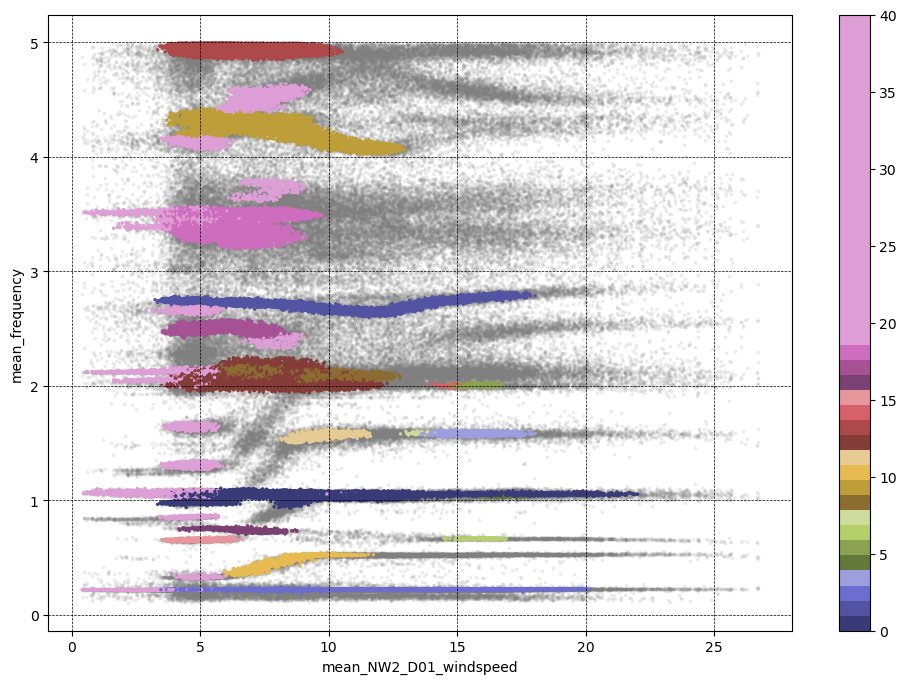

In [9]:
df1 = mpe_data['SS'].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed', 'mean_NW2_D01_pitch']
clustering_data = merged_df[cols].dropna()

mc = ModeClusterer(
    eps = 5,
    min_samples = 50,
    multipliers = {"mean_frequency": 150, "size": 1, "mean_damping": 10, 'mean_NW2_D01_windspeed': 5, 'mean_NW2_D01_pitch': 5},
    cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed', 'mean_NW2_D01_pitch'],
    min_size = 5.0,
    max_damping = 5.0
    )

mc.fit(clustering_data)

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = cmap, s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
#plt.title('Tracked modes in the Z (SS) direction')

Text(0, 0.5, 'mean_frequency')

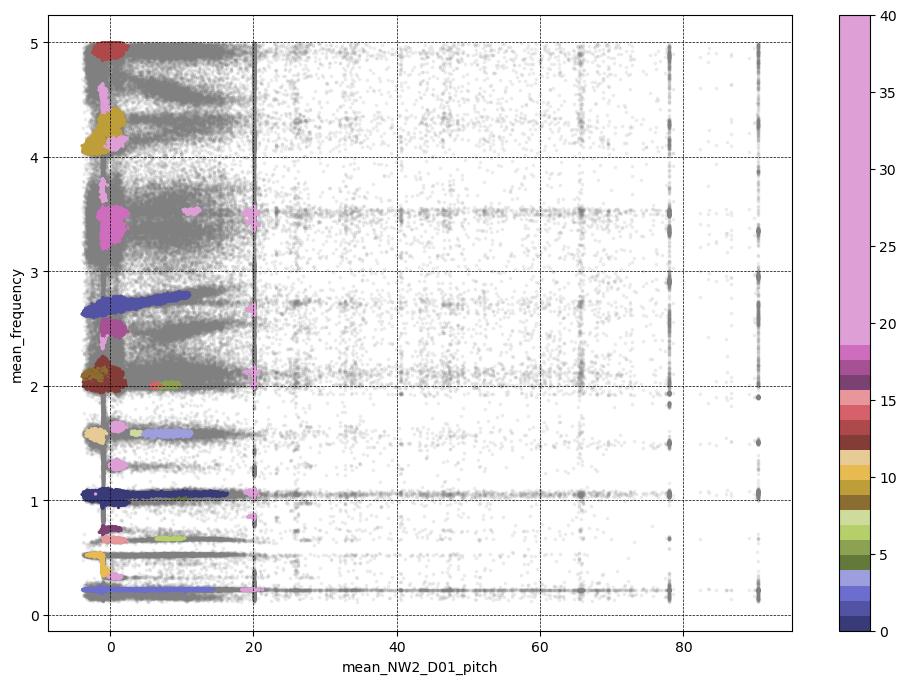

In [10]:
x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = cmap, s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)

Text(0, 0.5, 'mean_frequency')

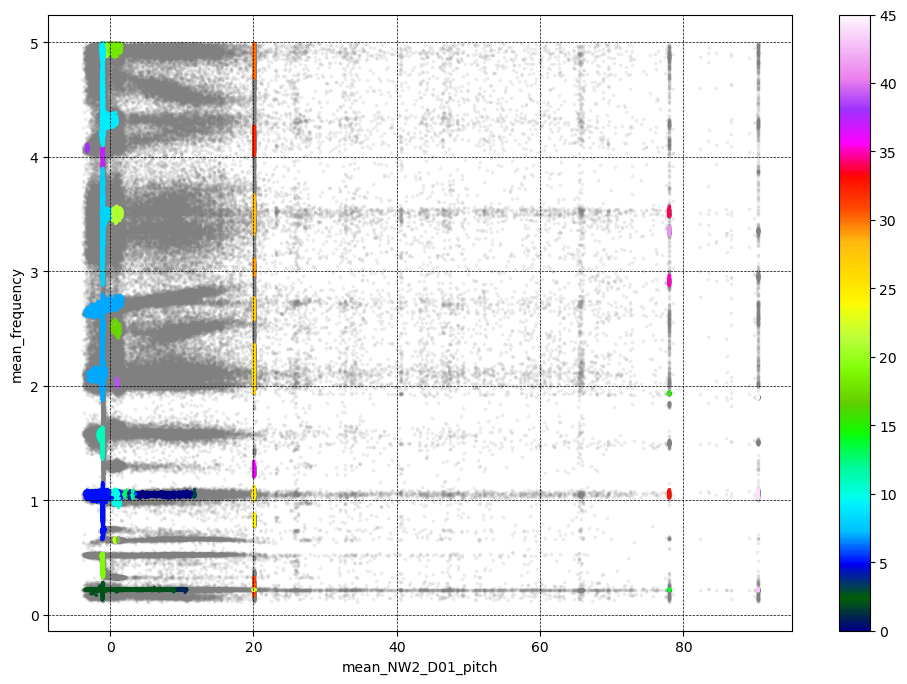

In [11]:
df1 = mpe_data['SS'].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed', 'mean_NW2_D01_pitch']
clustering_data = merged_df[cols].dropna()

mc = ModeClusterer(
    eps = 5,
    min_samples = 50,
    multipliers = {"mean_frequency": 100, "size": 2, "mean_damping": 2, 'mean_NW2_D01_pitch': 50},
    cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_pitch'],
    min_size = 5.0,
    max_damping = 5.0
    )

mc.fit(clustering_data)

x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = mc.predict(min_cluster_size=10)
clustering_data['labels'] = -1


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
#plt.title('Tracked modes in the Z (SS) direction')

Text(0, 0.5, 'mean_frequency')

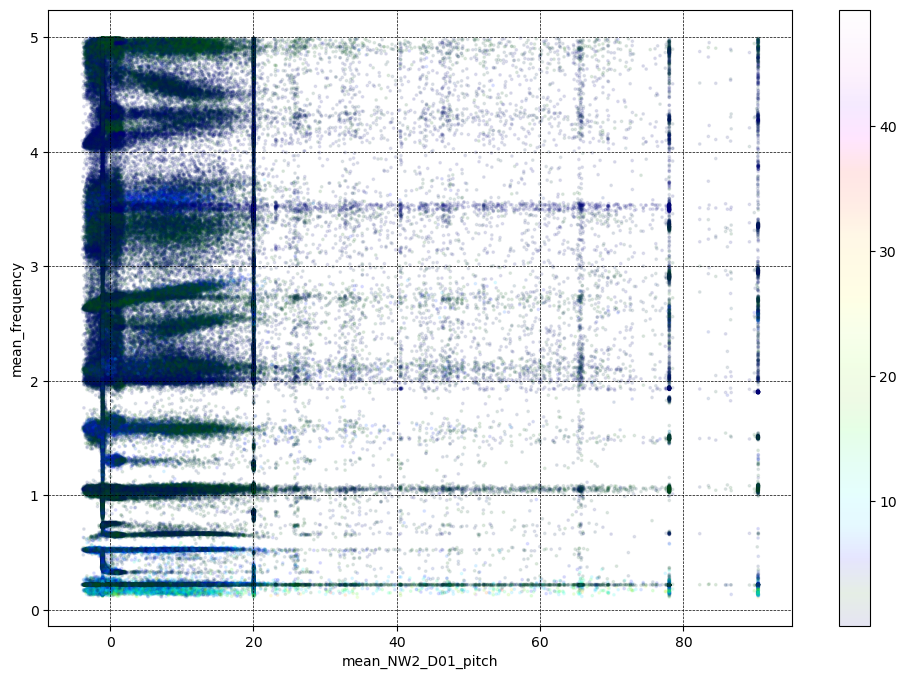

In [12]:
x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_damping'
clustered_modes = mc.predict(min_cluster_size=10)
clustering_data['labels'] = -1


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, c=clustering_data[color_col], cmap = 'gist_ncar', s=3)

plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)

In [13]:
df1 = mpe_data['SS'].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed']
clustering_data = merged_df[cols].dropna()

hdb_mc = ModeClusterer_HDBSCAN(
    min_cluster_size = 500,
    min_samples = 100,
    multipliers = {"mean_frequency": 150, "size": 1, "mean_damping": 10, 'mean_NW2_D01_windspeed': 5},
    cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed'],
    min_size = 5.0,
    max_damping = 5.0
    )

hdb_mc.fit(clustering_data)

Text(0, 0.5, 'mean_frequency')

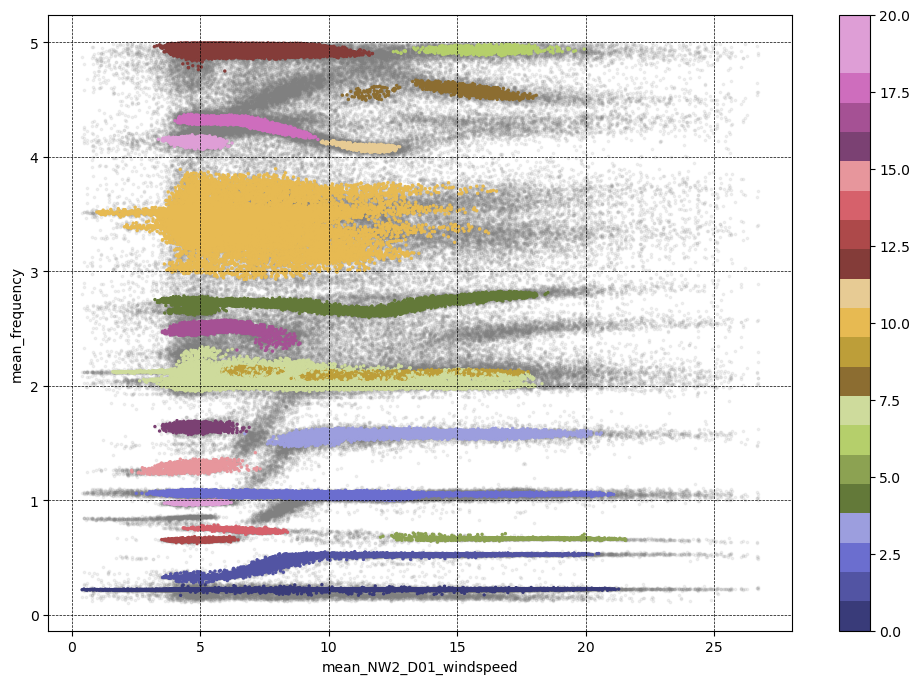

In [14]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=50)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = cmap, s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
#plt.title('Tracked modes in the Z (SS) direction')

Text(0, 0.5, 'mean_frequency')

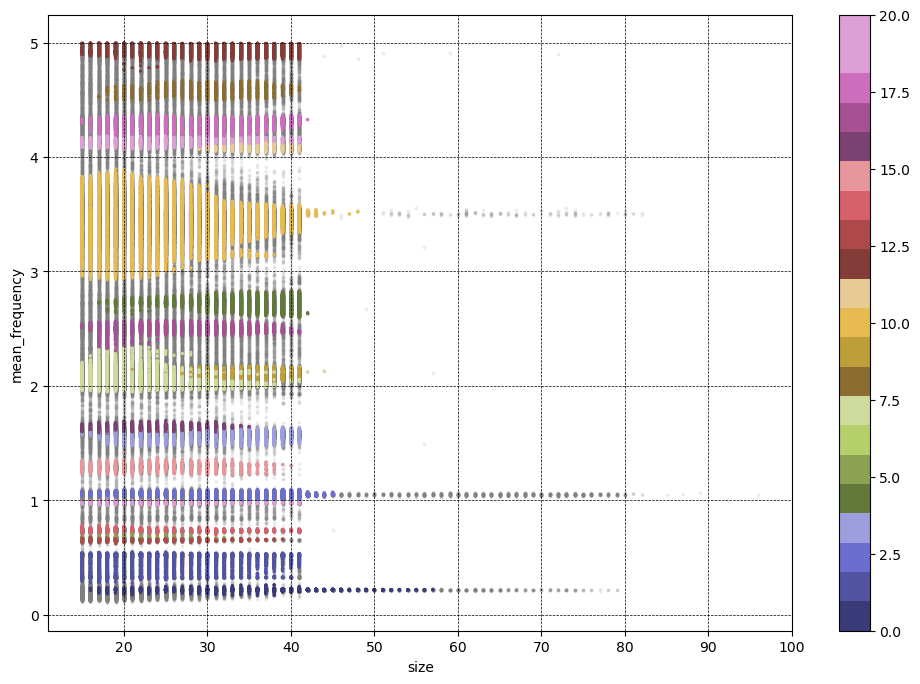

In [15]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'size'
y_col = 'mean_frequency'
color_col = 'labels'
clustered_modes = hdb_mc.predict(min_cluster_size=50)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes[color_col], cmap = cmap, s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
#plt.title('Tracked modes in the Z (SS) direction')

C:\Users\Max\AppData\Local\Temp\ipykernel_29396\1519492972.py:9: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cbar.draw_all()


Text(0, 0.5, 'mean_frequency')

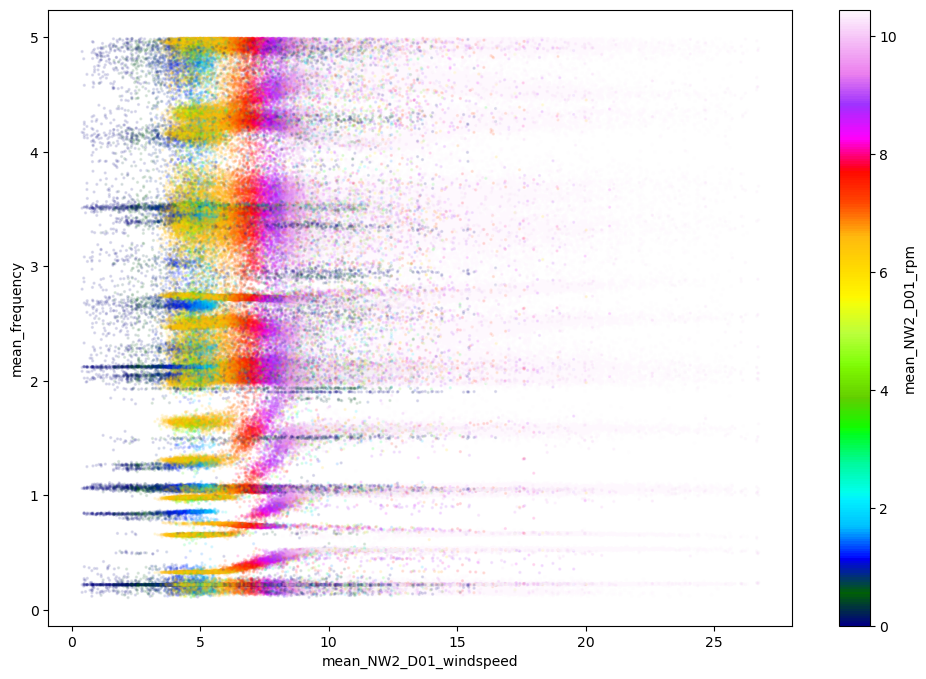

In [16]:
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
plt.figure(figsize=(12, 8))
plt.scatter(merged_df[x_col], merged_df[y_col], c=merged_df[color_col], cmap='gist_ncar', alpha=0.1, s=2)
cbar = plt.colorbar()
cbar.ax.set_ylabel(color_col)
cbar.set_alpha(1)
cbar.draw_all()
cbar.set_alpha(1)
plt.xlabel(x_col)
plt.ylabel(y_col)

C:\Users\Max\AppData\Local\Temp\ipykernel_29396\2324982509.py:9: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cbar.draw_all()


(0.0, 6.0)

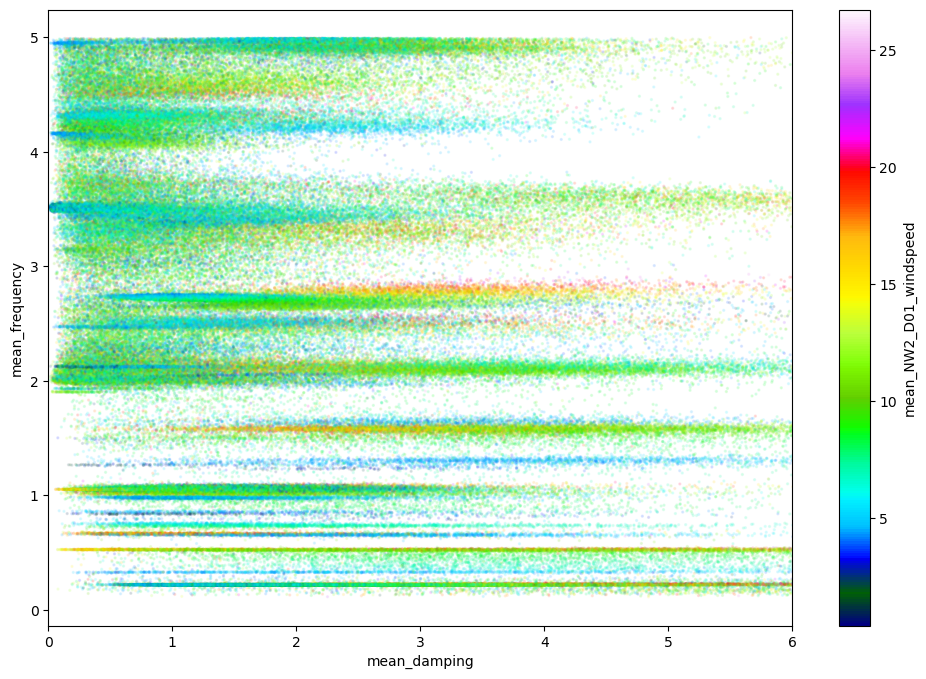

In [17]:
x_col = 'mean_damping'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_windspeed'
plt.figure(figsize=(12, 8))
plt.scatter(merged_df[x_col], merged_df[y_col], c=merged_df[color_col], cmap='gist_ncar', alpha=0.1, s=2)
cbar = plt.colorbar()
cbar.ax.set_ylabel(color_col)
cbar.set_alpha(1)
cbar.draw_all()
cbar.set_alpha(1)
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.xlim(0, 6)

C:\Users\Max\AppData\Local\Temp\ipykernel_29396\3669904092.py:9: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cbar.draw_all()


Text(0, 0.5, 'mean_frequency')

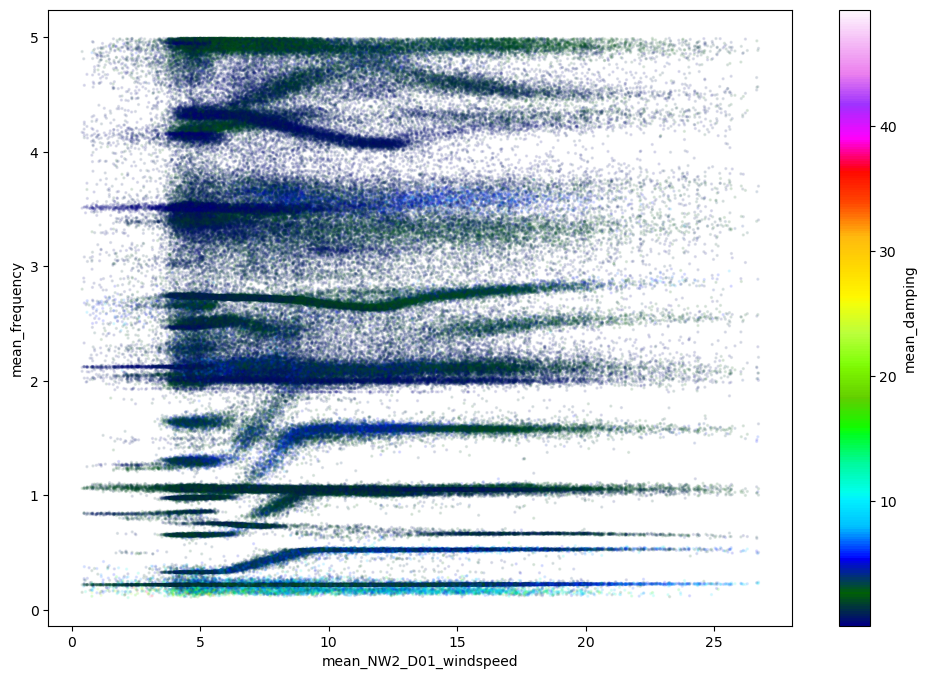

In [18]:
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_damping'
plt.figure(figsize=(12, 8))
plt.scatter(merged_df[x_col], merged_df[y_col], c=merged_df[color_col], cmap='gist_ncar', alpha=0.1, s=2)
cbar = plt.colorbar()
cbar.ax.set_ylabel(color_col)
cbar.set_alpha(1)
cbar.draw_all()
cbar.set_alpha(1)
plt.xlabel(x_col)
plt.ylabel(y_col)

Text(0.5, 1.0, 'Tracked modes in the FA direction')

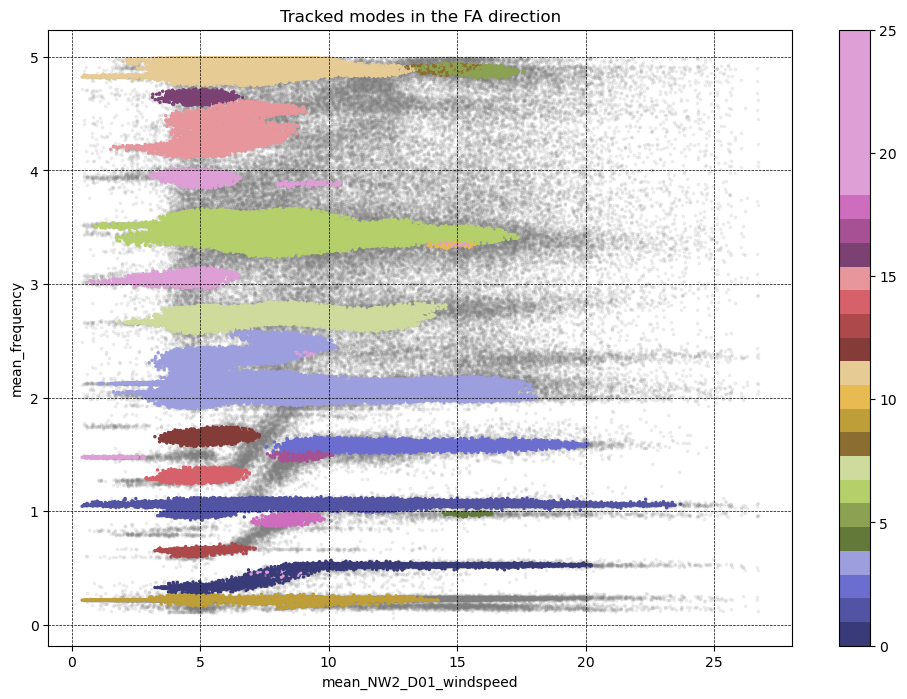

In [19]:
direction = 'FA'

df1 = mpe_data[direction].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed']
clustering_data = merged_df[cols].dropna()

mc = ModeClusterer(
    eps = 5,
    min_samples = 80,
    multipliers = {"mean_frequency": 150, "size": 2, "mean_damping": 0.2, 'mean_NW2_D01_windspeed': 5},
    cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed'],
    min_size = 5.0,
    max_damping = 5.0
    )

mc.fit(clustering_data)

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = cmap, s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

Text(0.5, 1.0, 'Tracked modes in the all direction')

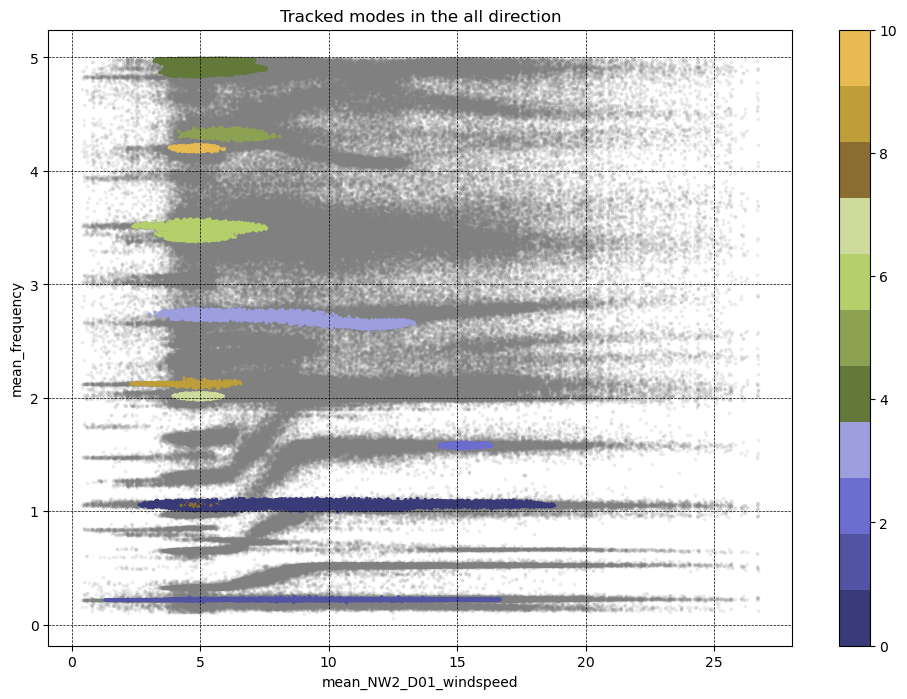

In [20]:
direction = 'all'

df1 = mpe_data['FA'].copy()
df2 = mpe_data['SS'].copy()
df_allmpe = pd.concat([df1, df2], axis=0)
df_allmpe.sort_values(by='timestamp', inplace=True)
df_inputs = inputs.copy()
df_inputs.rename_axis('timestamp', inplace=True)
merged_df = df_allmpe.merge(df_inputs, on='timestamp', how='left')
merged_df

cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed']
clustering_data = merged_df[cols].dropna()

mc = ModeClusterer(
    eps = 5,
    min_samples = 500,
    multipliers = {"mean_frequency": 150, "size": 2, "mean_damping": 5, 'mean_NW2_D01_windspeed': 5},
    cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed'],
    min_size = 5.0,
    max_damping = 5.0
    )

mc.fit(clustering_data)

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = cmap, s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

C:\Users\Max\AppData\Local\Temp\ipykernel_29396\481062074.py:9: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cbar.draw_all()


Text(0, 0.5, 'mean_frequency')

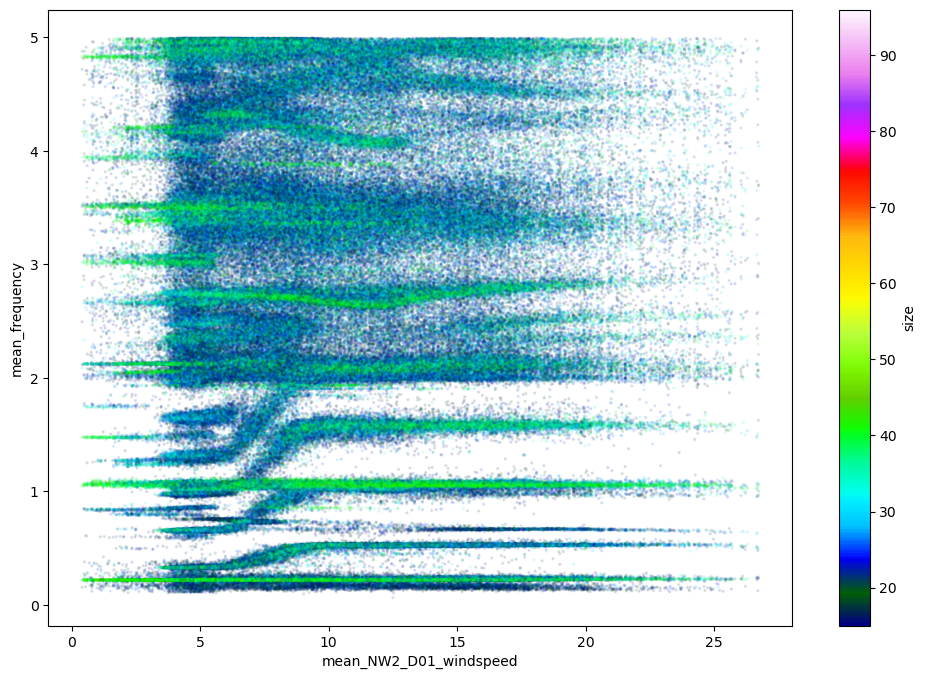

In [21]:
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'size'
plt.figure(figsize=(12, 8))
plt.scatter(merged_df[x_col], merged_df[y_col], c=merged_df[color_col], cmap='gist_ncar', alpha=0.1, s=2)
cbar = plt.colorbar()
cbar.ax.set_ylabel(color_col)
cbar.set_alpha(1)
cbar.draw_all()
cbar.set_alpha(1)
plt.xlabel(x_col)
plt.ylabel(y_col)

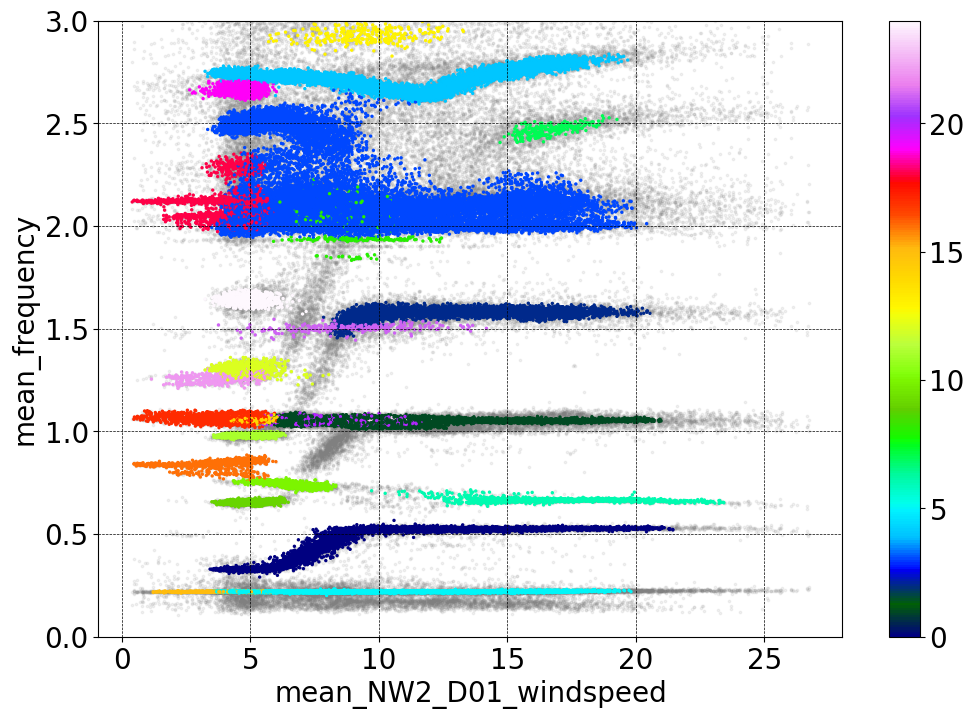

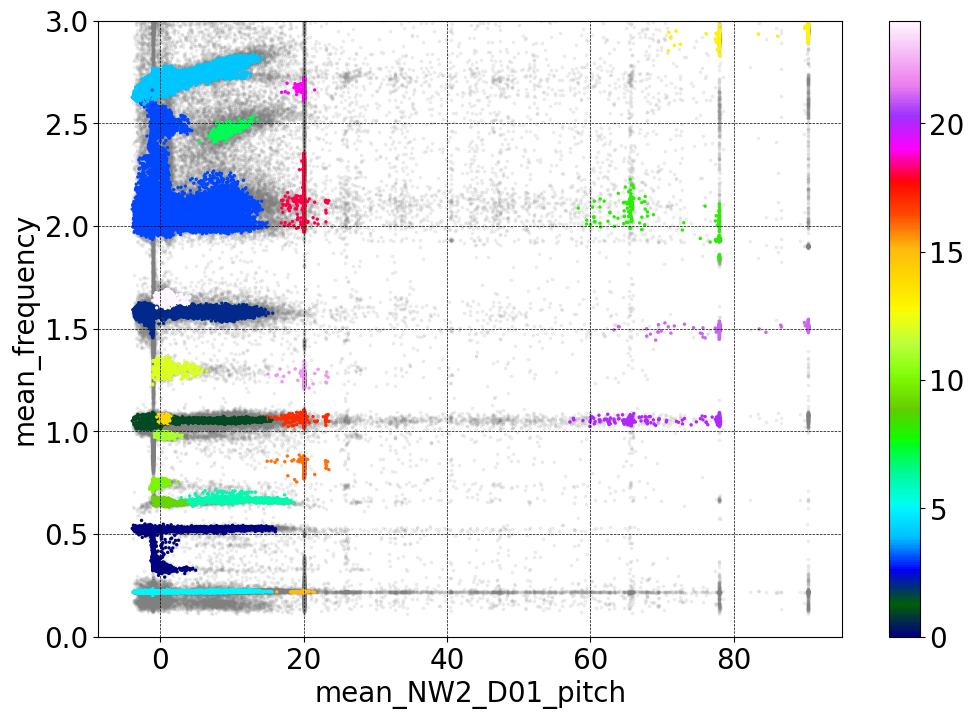

In [42]:
df1 = mpe_data['SS'].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

frequency_range=(0,3)
cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed', 'mean_NW2_D01_pitch']
clustering_data = merged_df[cols].dropna()

hdb_mc = ModeClusterer_HDBSCAN(
    min_cluster_size = 200,
    min_samples = 50,
    multipliers = {"mean_frequency": 150, "size": 1, "mean_damping": 10, 'mean_NW2_D01_windspeed': 5, 'mean_NW2_D01_pitch': 2},
    cols = cols,
    min_size = 5.0,
    max_damping = 5.0
    )

hdb_mc.fit(clustering_data, frequency_range=frequency_range)

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.ylim(frequency_range)
plt.show()

x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)

fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.ylim(frequency_range)
plt.show()

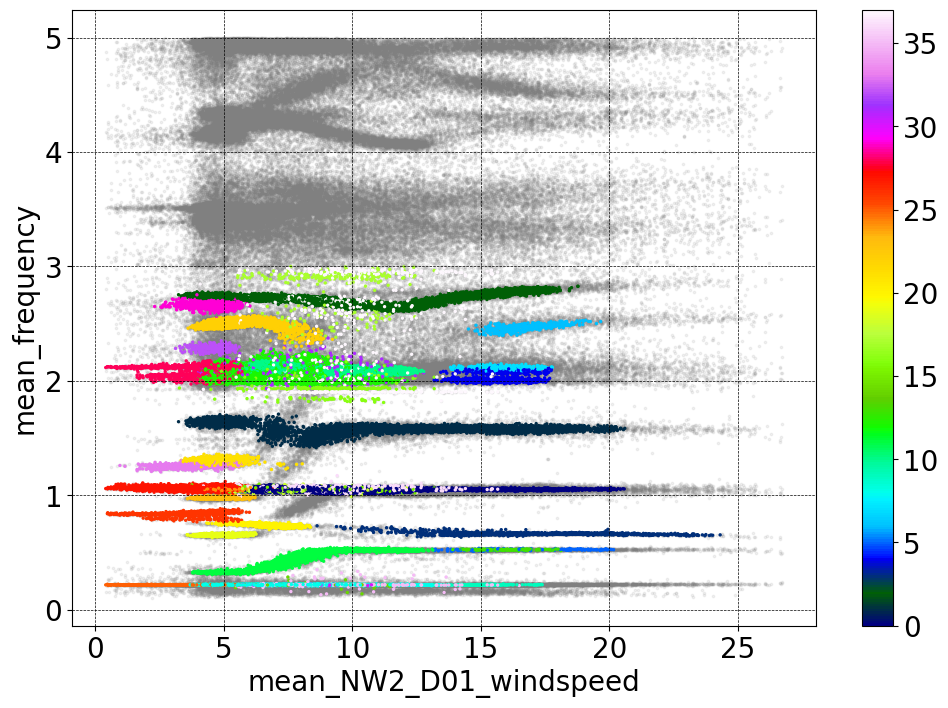

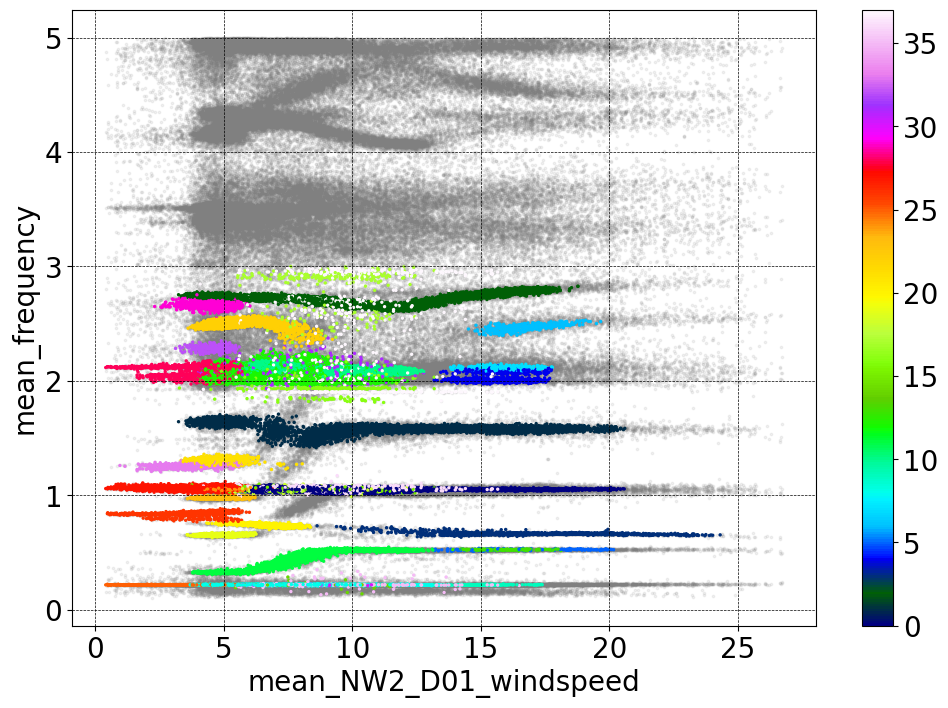

In [38]:
df1 = mpe_data['SS'].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

frequency_range=(0,3)
cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed', 'mean_NW2_D01_pitch']
clustering_data = merged_df[cols].dropna()

hdb_mc = ModeClusterer_HDBSCAN(
    min_cluster_size = 200,
    min_samples = 50,
    multipliers = {"mean_frequency": 150, "size": 1, "mean_damping": 10, 'mean_NW2_D01_windspeed': 5, 'mean_NW2_D01_pitch': 5},
    cols = cols,
    min_size = 5.0,
    max_damping = 5.0
    )

hdb_mc.fit(clustering_data, frequency_range=frequency_range)

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.ylim(frequency_range)
plt.show()

x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)

fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.ylim(frequency_range)
plt.show()

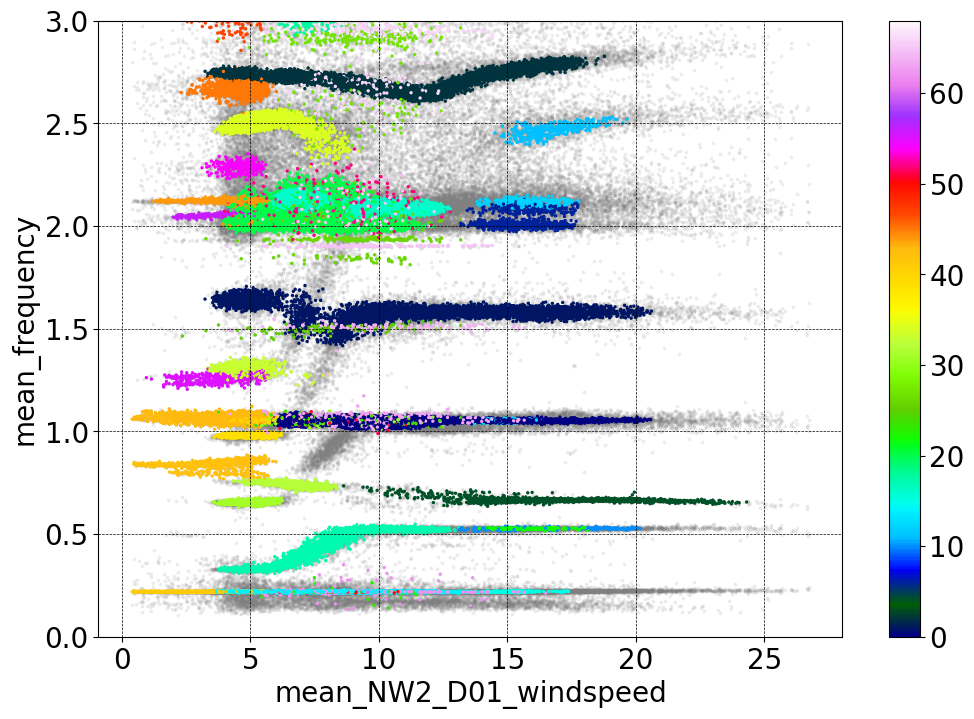

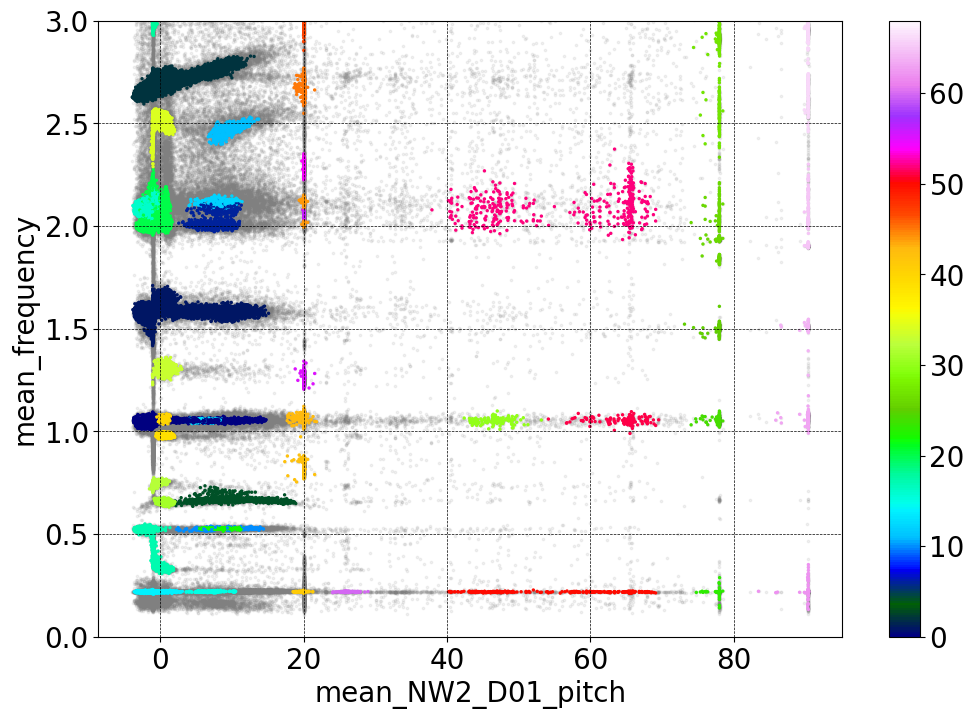

In [41]:
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.ylim(0, 3)

plt.show()


x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)

fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.ylim(0, 3)
plt.show()

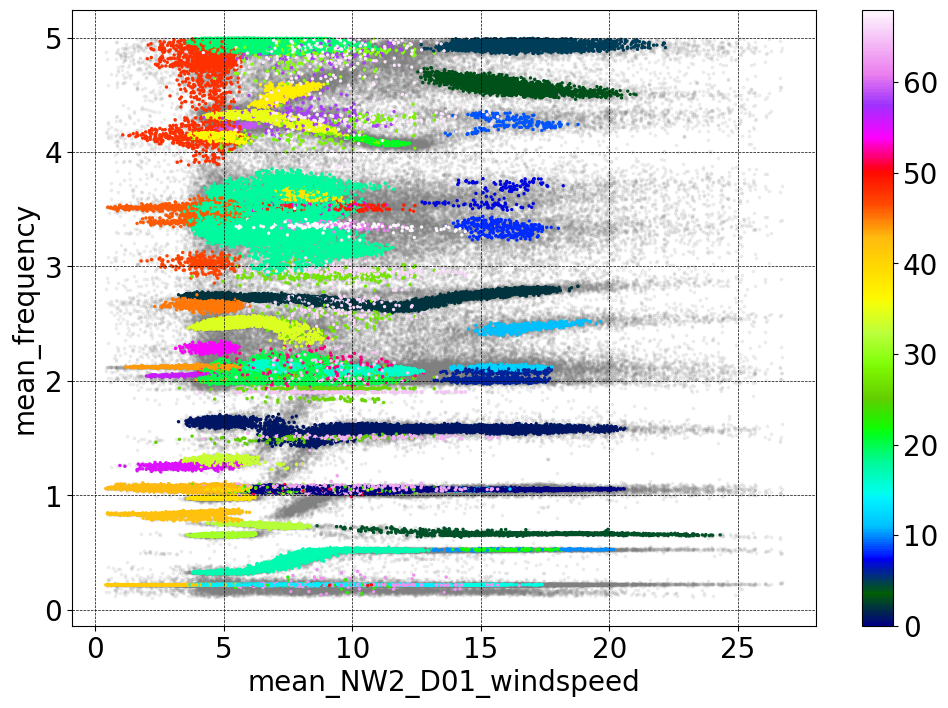

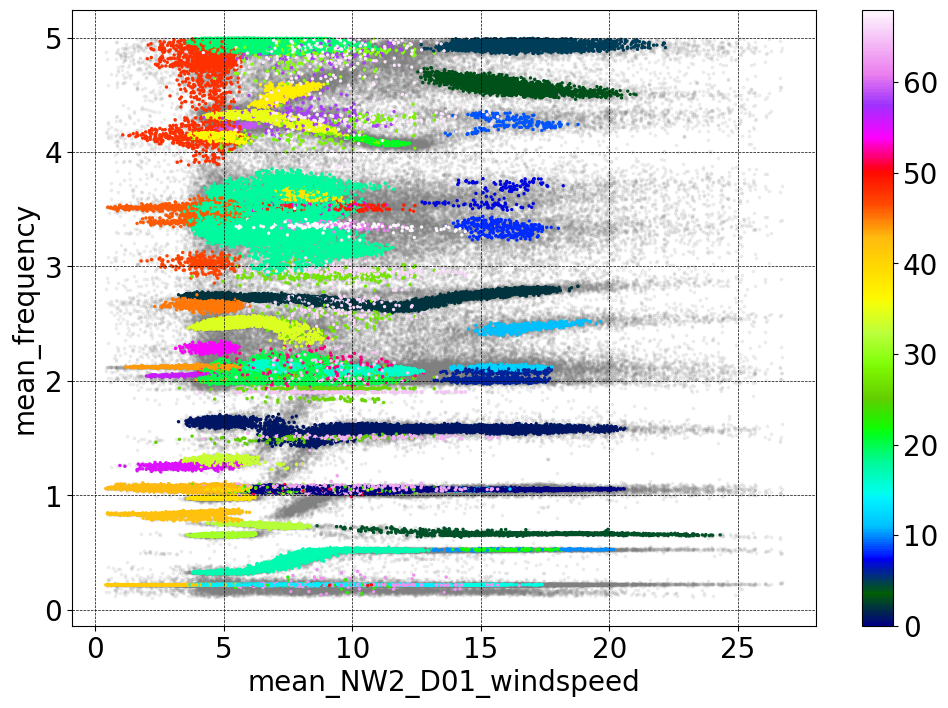

In [39]:
df1 = mpe_data['SS'].copy()
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
merged_df = df1.merge(df2, on='timestamp', how='left')

cols = ['mean_frequency', 'size', 'mean_damping', 'mean_NW2_D01_windspeed', 'mean_NW2_D01_pitch']
clustering_data = merged_df[cols].dropna()

hdb_mc = ModeClusterer_HDBSCAN(
    min_cluster_size = 100,
    min_samples = 50,
    multipliers = {"mean_frequency": 150, "size": 1, "mean_damping": 10, 'mean_NW2_D01_windspeed': 5, 'mean_NW2_D01_pitch': 5},
    cols = cols,
    min_size = 5.0,
    max_damping = 5.0
    )

hdb_mc.fit(clustering_data)

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.show()

x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)

fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.show()

Text(0, 0.5, 'mean_frequency')

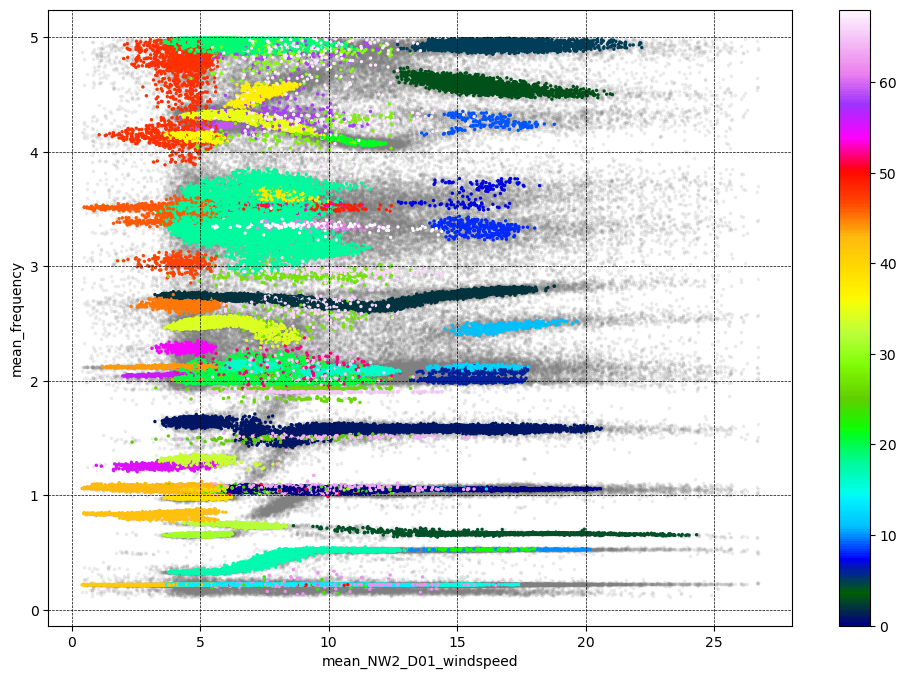

In [23]:
x_col = 'mean_NW2_D01_windspeed'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)

fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)
#plt.title('Tracked modes in the Z (SS) direction')

Text(0, 0.5, 'mean_frequency')

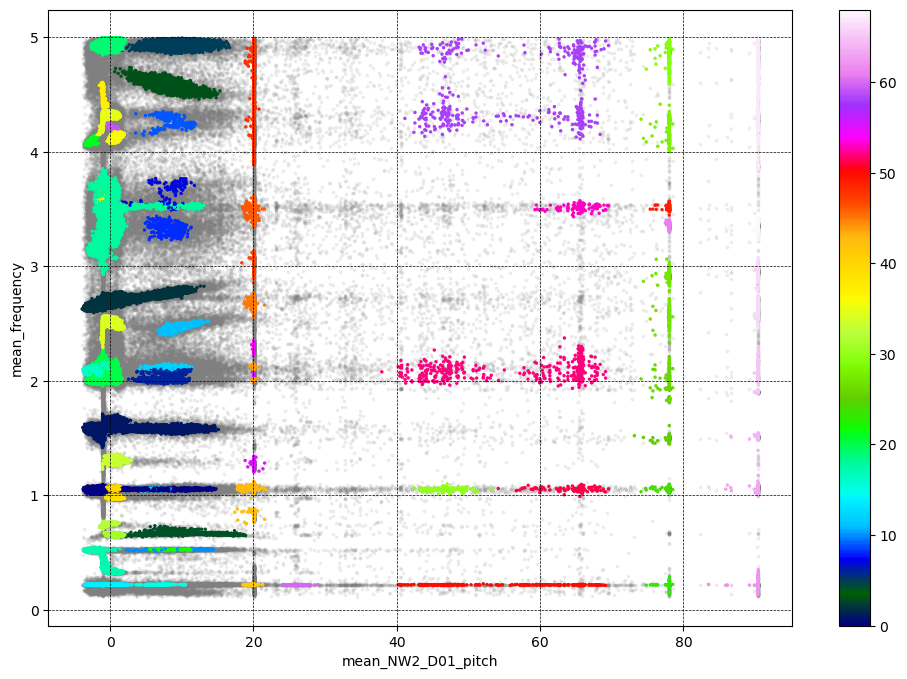

In [24]:
x_col = 'mean_NW2_D01_pitch'
y_col = 'mean_frequency'
color_col = 'mean_NW2_D01_rpm'
clustered_modes = hdb_mc.predict(min_cluster_size=10)


fig = plt.figure(figsize = (12,8))
plt.scatter(clustering_data[x_col], clustering_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(clustered_modes.labels.unique()),1))
cmap = ListedColormap(first_colors)

plt.scatter(clustered_modes[x_col], clustered_modes[y_col], c=clustered_modes['labels'], cmap = 'gist_ncar', s=2)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar()
plt.xlabel(x_col)
plt.ylabel(y_col)

In [25]:
mc = ModeClusterer(
    eps = 5,
    min_samples = 100,
    multipliers = {"frequency": 40, "size": 0.5, "damping": 1},
    index_divider = 20000,
    cols = ['frequency', 'size', 'damping'],
    min_size = 5.0,
    max_damping = 5.0
    )

Text(0.5, 1.0, 'Tracked modes in the SS direction')

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


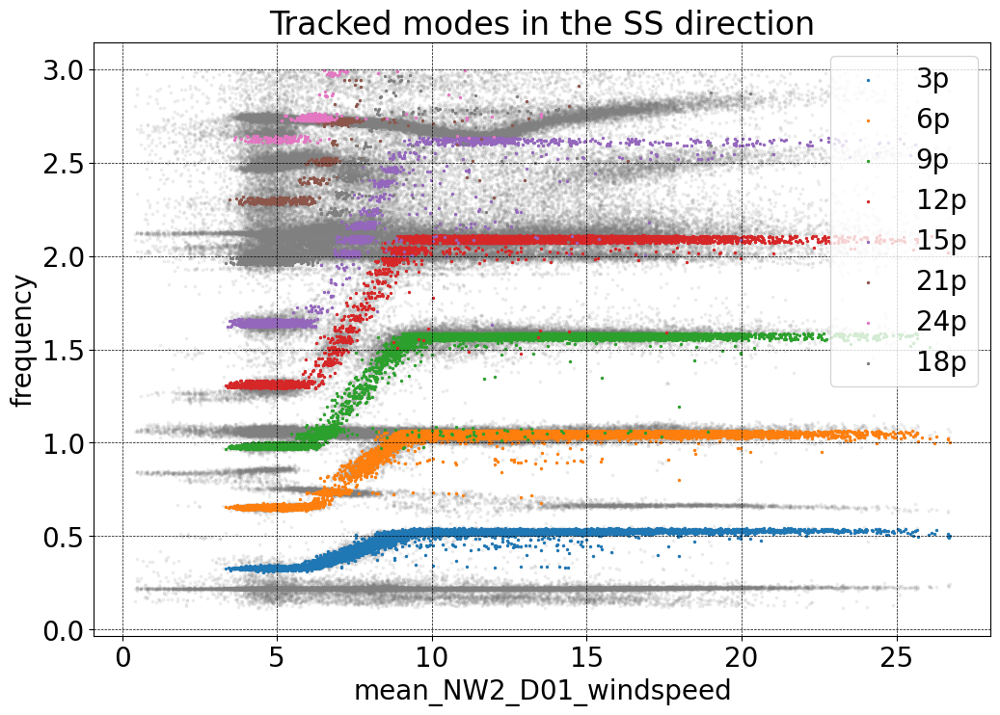

In [44]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
direction = 'SS'
clustering_data = {}
harmonic_detectors = {}
clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=6.5, max_distance = 0.02, p_orders=[3,6,9,12,15, 18, 21, 24])

df1 = harmonic_detectors[direction].cluster_harmonics(rpm_col = 'mean_NW2_D01_rpm', frequency_range=(0,3))
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
harmonic_plot_data = df1.merge(df2, on='timestamp', how='left')

x_col = 'mean_NW2_D01_windspeed'
y_col = 'frequency'

fig = plt.figure(figsize = (12,8))
plt.scatter(harmonic_plot_data[x_col], harmonic_plot_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab10')
first_colors = tab(range(0,len(harmonic_plot_data['harmonic'].unique()),1))
cmap = ListedColormap(first_colors)
for harmonic in harmonic_plot_data['harmonic'].unique()[1:]:
    harmonic_data_ = harmonic_plot_data.loc[harmonic_plot_data['harmonic'] == harmonic]
    plt.scatter(harmonic_data_[x_col], harmonic_data_[y_col], s=2, label = str(harmonic)+'p')
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

Text(0.5, 1.0, 'Tracked modes in the SS direction')

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


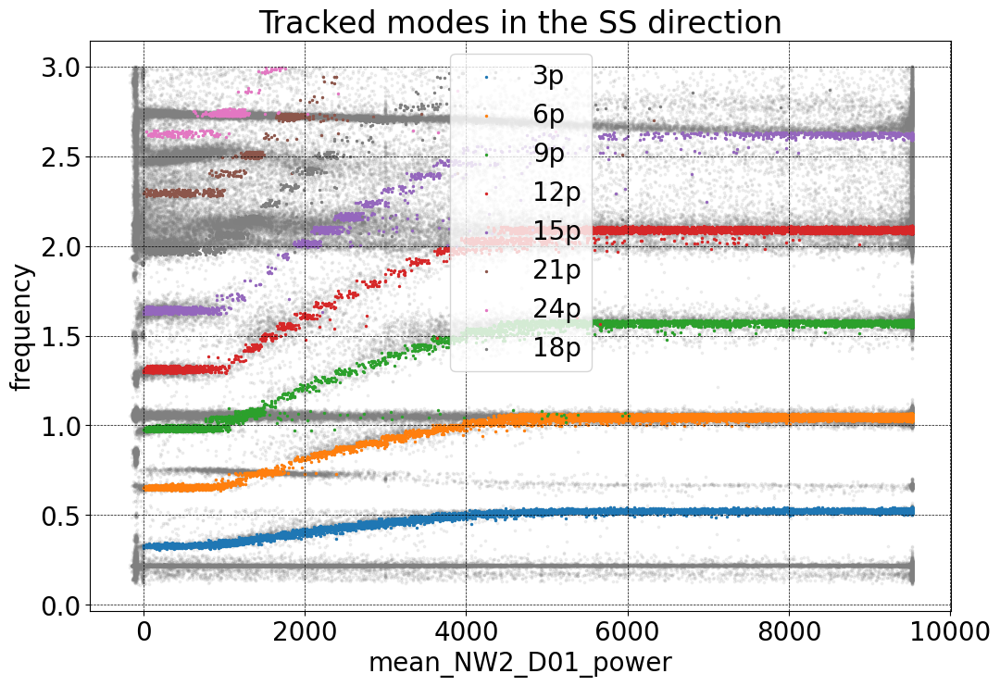

In [45]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
direction = 'SS'
clustering_data = {}
harmonic_detectors = {}
clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=6.5, max_distance = 0.02, p_orders=[3,6,9,12,15, 18, 21, 24])

df1 = harmonic_detectors[direction].cluster_harmonics(rpm_col = 'mean_NW2_D01_rpm', frequency_range=(0,3))
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
harmonic_plot_data = df1.merge(df2, on='timestamp', how='left')

x_col = 'mean_NW2_D01_power'
y_col = 'frequency'

fig = plt.figure(figsize = (12,8))
plt.scatter(harmonic_plot_data[x_col], harmonic_plot_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab10')
first_colors = tab(range(0,len(harmonic_plot_data['harmonic'].unique()),1))
cmap = ListedColormap(first_colors)
for harmonic in harmonic_plot_data['harmonic'].unique()[1:]:
    harmonic_data_ = harmonic_plot_data.loc[harmonic_plot_data['harmonic'] == harmonic]
    plt.scatter(harmonic_data_[x_col], harmonic_data_[y_col], s=2, label = str(harmonic)+'p')
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

Text(0.5, 1.0, 'Tracked modes in the SS direction')

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


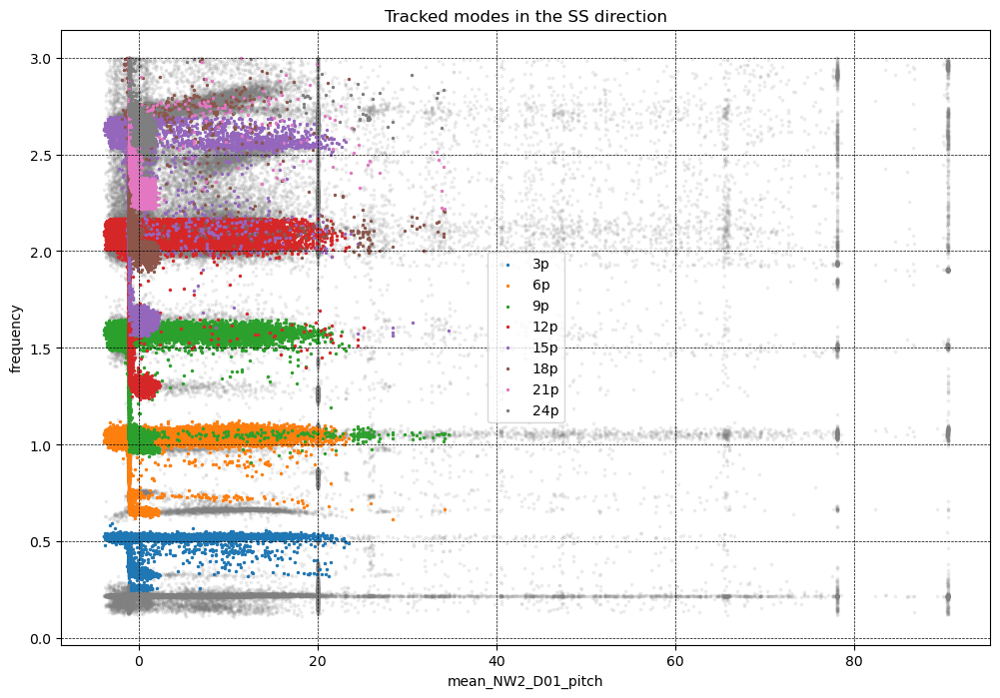

In [28]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
direction = 'SS'
clustering_data = {}
harmonic_detectors = {}
clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=6.5, max_distance = 0.08, p_orders=[3,6,9,12,15, 18, 21, 24])

df1 = harmonic_detectors[direction].cluster_harmonics(rpm_col = 'mean_NW2_D01_rpm', frequency_range=(0,3))
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
harmonic_plot_data = df1.merge(df2, on='timestamp', how='left')

x_col = 'mean_NW2_D01_pitch'
y_col = 'frequency'

fig = plt.figure(figsize = (12,8))
plt.scatter(harmonic_plot_data[x_col], harmonic_plot_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab10')
first_colors = tab(range(0,len(harmonic_plot_data['harmonic'].unique()),1))
cmap = ListedColormap(first_colors)
for harmonic in harmonic_plot_data['harmonic'].unique()[1:]:
    harmonic_data_ = harmonic_plot_data.loc[harmonic_plot_data['harmonic'] == harmonic]
    plt.scatter(harmonic_data_[x_col], harmonic_data_[y_col], s=2, label = str(harmonic)+'p')
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

In [29]:
harmonic_plot_data.columns

Index(['algorithm', 'damping', 'frequency', 'size', 'std_damping',
       'std_frequency', 'distance_3p', 'distance_6p', 'distance_9p',
       'distance_12p', 'distance_15p', 'distance_18p', 'distance_21p',
       'distance_24p', 'mean_NW2_D01_rpm_x', 'harmonic',
       'mvbc_WandelaarBuoy_10%_highest_waves',
       'mvbc_WandelaarBuoy_Wave_height',
       'mvbc_WandelaarBuoy_Average_wave_period',
       'mvbc_WandelaarBuoy_Height_waves_with_period_>_10_s',
       'mvbc_WandelaarMeasuringpile_Max_3-seconds_wind_gust_(at_10_m_height)',
       'mvbc_WandelaarMeasuringpile_Average_wind_direction',
       'mvbc_WandelaarMeasuringpile_Average_wind_speed_(at_10_m_height)',
       'mvbc_WandelaarMeasuringpile_Tide_TAW',
       'mvbc_WandelaarMeasuringpile_Air_pressure',
       'mvbc_WandelaarMeasuringpile_Air_temperature', 'mean_NW2_D01_rpm_y',
       'mean_NW2_D01_yaw', 'mean_NW2_D01_pitch', 'mean_NW2_D01_power',
       'mean_NW2_D01_windspeed', 'mean_NW2_D01_winddirection'],
      dtype='ob

Text(0.5, 1.0, 'Tracked modes in the FA direction')

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


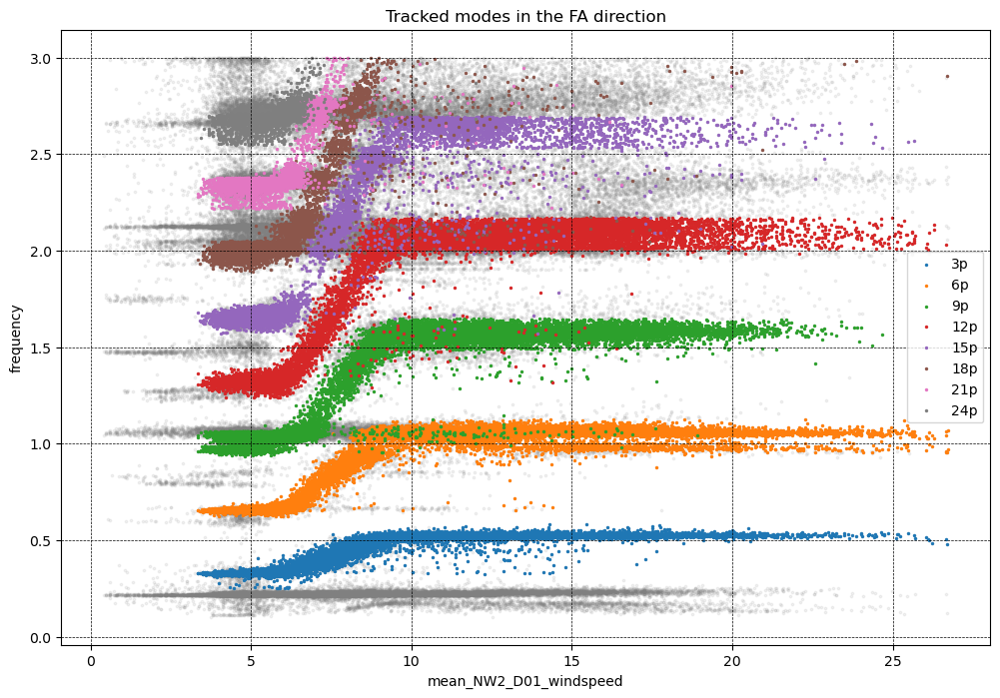

In [30]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
direction = 'FA'
clustering_data = {}
harmonic_detectors = {}
clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=6.5, max_distance = 0.08, p_orders=[3,6,9,12,15, 18, 21, 24])

df1 = harmonic_detectors[direction].cluster_harmonics(rpm_col = 'mean_NW2_D01_rpm', frequency_range=(0,3))
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
harmonic_plot_data = df1.merge(df2, on='timestamp', how='left')

x_col = 'mean_NW2_D01_windspeed'
y_col = 'frequency'

fig = plt.figure(figsize = (12,8))
plt.scatter(harmonic_plot_data[x_col], harmonic_plot_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(harmonic_plot_data['harmonic'].unique()),1))
cmap = ListedColormap(first_colors)
for harmonic in harmonic_plot_data['harmonic'].unique()[1:]:
    harmonic_data_ = harmonic_plot_data.loc[harmonic_plot_data['harmonic'] == harmonic]
    plt.scatter(harmonic_data_[x_col], harmonic_data_[y_col], s=2, label = str(harmonic)+'p')
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

Text(0.5, 1.0, 'Tracked modes in the FA direction')

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


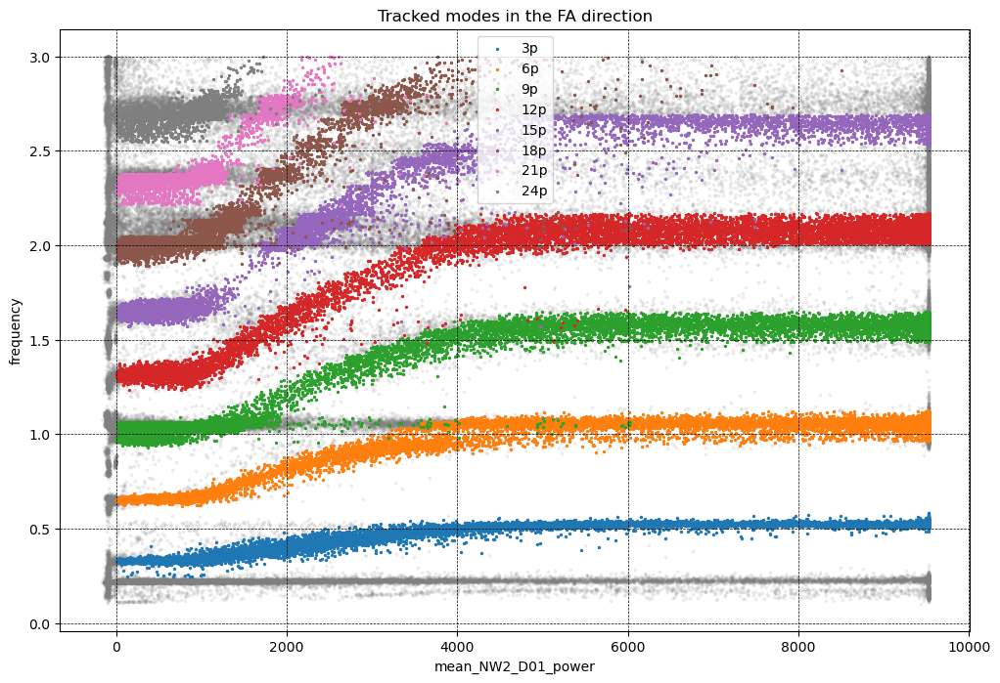

In [31]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
direction = 'FA'
clustering_data = {}
harmonic_detectors = {}
clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=6.5, max_distance = 0.08, p_orders=[3,6,9,12,15, 18, 21, 24])

df1 = harmonic_detectors[direction].cluster_harmonics(rpm_col = 'mean_NW2_D01_rpm', frequency_range=(0,3))
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
harmonic_plot_data = df1.merge(df2, on='timestamp', how='left')

x_col = 'mean_NW2_D01_power'
y_col = 'frequency'

fig = plt.figure(figsize = (12,8))
plt.scatter(harmonic_plot_data[x_col], harmonic_plot_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab20b')
first_colors = tab(range(0,len(harmonic_plot_data['harmonic'].unique()),1))
cmap = ListedColormap(first_colors)
for harmonic in harmonic_plot_data['harmonic'].unique()[1:]:
    harmonic_data_ = harmonic_plot_data.loc[harmonic_plot_data['harmonic'] == harmonic]
    plt.scatter(harmonic_data_[x_col], harmonic_data_[y_col], s=2, label = str(harmonic)+'p')
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

Text(0.5, 1.0, 'Tracked modes in the FA direction')

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


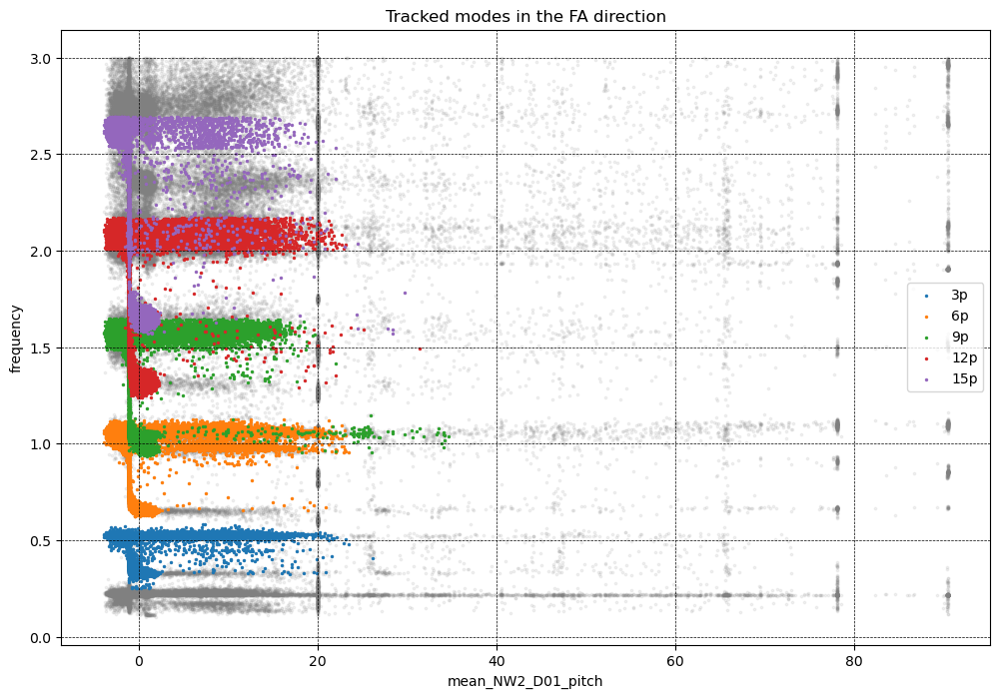

In [32]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
direction = 'FA'
clustering_data = {}
harmonic_detectors = {}
clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=6.5, max_distance = 0.08, p_orders=[3,6,9,12,15])

df1 = harmonic_detectors[direction].cluster_harmonics(rpm_col = 'mean_NW2_D01_rpm', frequency_range=(0,3))
df2 = inputs.copy()
df2.rename_axis('timestamp', inplace=True)
harmonic_plot_data = df1.merge(df2, on='timestamp', how='left')

x_col = 'mean_NW2_D01_pitch'
y_col = 'frequency'

fig = plt.figure(figsize = (12,8))
plt.scatter(harmonic_plot_data[x_col], harmonic_plot_data[y_col], alpha=0.1, color='grey', s=3)

tab = plt.get_cmap('tab10')
first_colors = tab(range(0,len(harmonic_plot_data['harmonic'].unique()),1))
cmap = ListedColormap(first_colors)
for harmonic in harmonic_plot_data['harmonic'].unique()[1:]:
    harmonic_data_ = harmonic_plot_data.loc[harmonic_plot_data['harmonic'] == harmonic]
    plt.scatter(harmonic_data_[x_col], harmonic_data_[y_col], s=2, label = str(harmonic)+'p')
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend()
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title('Tracked modes in the ' + direction + ' direction')

mean_NW2_D01_rpm    10.445
dtype: float64


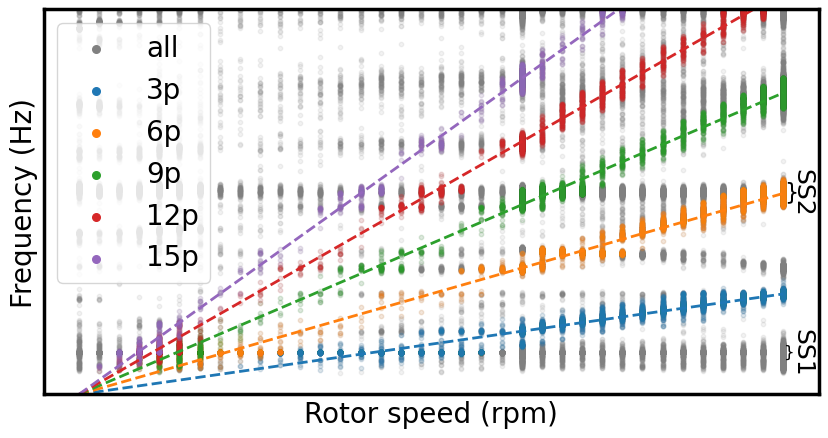

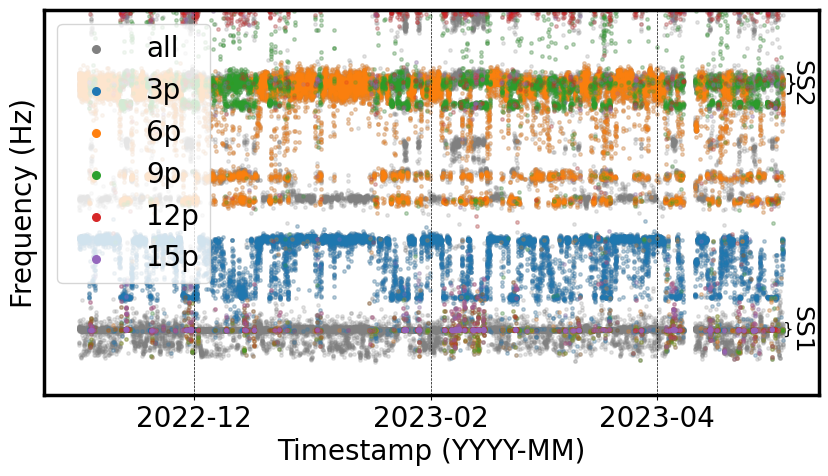

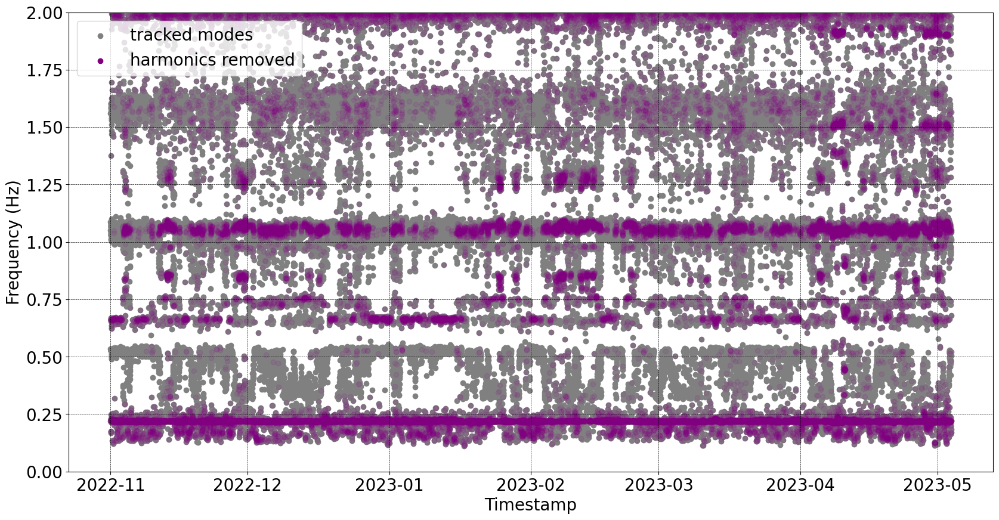

In [33]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
plt.rcParams.update({'font.size': 20})
clustering_data = {}
harmonic_detectors = {}
harmonics_removed = {}
for direction in ['SS']:
    clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
    harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=0, max_distance = 0.08, p_orders=[3,6,9,12, 15])
    distance_calculator_data = harmonic_detectors[direction].get_distance_calculator_data()
    harmonic_detectors[direction].plot_distances()
    harmonic_detectors[direction].plot_harmonics_removed()
    harmonics_removed[direction] = harmonic_detectors[direction].remove_harmonics()